# Assignment 2: Feature Extraction

In [154]:
# Paths
path_folder_Q1 = "/kaggle/input/a2-w24-images/Data/Q1/"
path_folder_Q3 = "/kaggle/input/a2-w24-images/Data/Q3/"
path_my_folder = "/kaggle/input/a2-imgs/" # Cropped images for Section 1

In [155]:
# Imports
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [156]:
# From tutorial 3
def non_max_suppression(img_mag, img_phs):
    
    M, N = img_mag.shape
    Z = np.zeros((M,N), dtype=np.int32)
    
    # convert img_phs (radian) into angle image
    img_angle = img_phs * 180. / np.pi
    img_angle[img_angle < 0] += 180

    
    for i in range(1,M-1): # Note that we are leaving 1 pixel gap on each side of image
        for j in range(1,N-1): # as for boundary pixels one of its neighbourhood pixel is not defined
            
            # store neighbourhood pixels in variables q and r
            q = 255
            r = 255

            #angle 0
            if (0 <= img_angle[i,j] < 22.5) or (157.5 <= img_angle[i,j] <= 180):
                q = img_mag[i, j+1]
                r = img_mag[i, j-1]
            #angle 45
            elif (22.5 <= img_angle[i,j] < 67.5):
                q = img_mag[i+1, j-1]
                r = img_mag[i-1, j+1]
            #angle 90
            elif (67.5 <= img_angle[i,j] < 112.5):
                q = img_mag[i+1, j]
                r = img_mag[i-1, j]
            #angle 135
            elif (112.5 <= img_angle[i,j] < 157.5):
                q = img_mag[i-1, j-1]
                r = img_mag[i+1, j+1]

            # if pixel magnitude is higher than both its neighbour than keep     
            if (img_mag[i,j] >= q) and (img_mag[i,j] >= r):
                Z[i,j] = img_mag[i,j]
            # otherwise make its value to 0
            else:
                Z[i,j] = 0
    
    return Z

# Modified with the opencv2 Sobel
def sobel_filters(img):
    
    Ix = cv2.Sobel(img, cv2.CV_64F, 1, 0)
    Iy = cv2.Sobel(img, cv2.CV_64F, 1, 0)
    
    # compute sobel Magnitude/Phase
    Im = cv2.magnitude(Ix, Iy)
    Im = Im / Im.max() * 255
    Ip = cv2.phase(Ix, Iy)    

    return (Im, Ip)

### 1 Harris Corner Detection

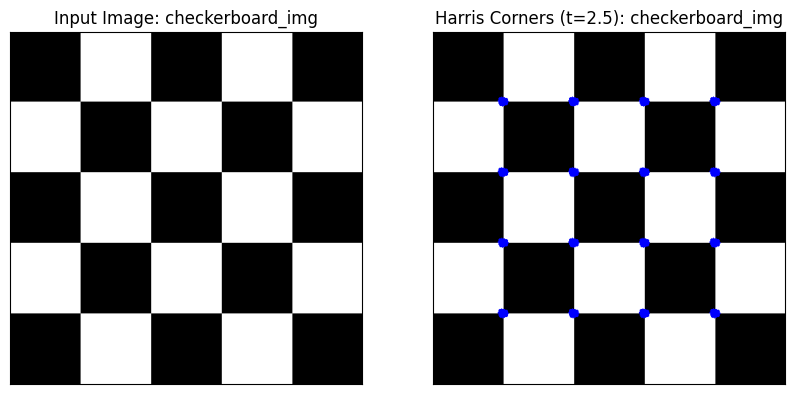

In [157]:
# Loading image as grayscale
checkerboard_img = cv2.imread(path_folder_Q1 + "checkerboard.png")
courthouse_img = cv2.imread(path_folder_Q1 + "courthouse_gray.jpg")
rubiks_img = cv2.imread(path_my_folder + "image_1.jpg")
rubiks_img = cv2.cvtColor(rubiks_img, cv2.COLOR_BGR2RGB)


checkerboard_img_gray = checkerboard_img.copy()
checkerboard_img_gray = cv2.cvtColor(checkerboard_img_gray, cv2.COLOR_BGR2GRAY)

courthouse_img_gray = courthouse_img.copy()
courthouse_img_gray = cv2.cvtColor(courthouse_img_gray, cv2.COLOR_BGR2GRAY)

rubiks_img_gray = rubiks_img.copy()
rubiks_img_gray = cv2.cvtColor(rubiks_img_gray, cv2.COLOR_BGR2GRAY)
# Blurring only the last image
rubiks_img_gray = cv2.GaussianBlur(rubiks_img_gray, (5,5), 0)


# Compute the image derivatives (Using Sobel with 3x3 kernel)
# [(checkerboard_img_x, checkerboard_img_y), (courthouse_img_x, courthouse_img_y), (rubiks_img_x, rubiks_img_y)]
sobel_values= []
checkerboard_img_x = cv2.Sobel(checkerboard_img_gray, cv2.CV_64F, 1, 0)
checkerboard_img_y = cv2.Sobel(checkerboard_img_gray, cv2.CV_64F, 0, 1)
sobel_values.append((checkerboard_img_x, checkerboard_img_y))

courthouse_img_x = cv2.Sobel(courthouse_img_gray, cv2.CV_64F, 1, 0)
courthouse_img_y = cv2.Sobel(courthouse_img_gray, cv2.CV_64F, 0, 1)
sobel_values.append((courthouse_img_x, courthouse_img_y))

rubiks_img_x = cv2.Sobel(rubiks_img_gray, cv2.CV_64F, 1, 0, )
rubiks_img_y = cv2.Sobel(rubiks_img_gray, cv2.CV_64F, 0, 1, )
sobel_values.append((rubiks_img_x, rubiks_img_y))


# Compute the square of the derivatives
# [x*x, y*y, x*y, ...]
square_values = []
for i, j in sobel_values:
    square_values.append(i**2)
    square_values.append(j**2)
    square_values.append(i*j)

# Apply Gaussian Filtering
gaussian_filters = []
for i in square_values:
    gaussian_filters.append(cv2.GaussianBlur(i, (5,5), 0))

# Compute the cornerness function response
k = 0.05
corner_responses = []
for i in range(0, len(gaussian_filters), 3):
    xx = gaussian_filters[i]
    yy = gaussian_filters[i+1]
    xy = gaussian_filters[i+2]
    corner_responses.append((xx*yy - xy**2) - k*((xx+yy)**2))
    
# Perform non-maximum suppression
non_max_sup = []
# Finding the Magnitude and the Phase
for i in range(len(corner_responses)):
    mag, pha = sobel_filters(corner_responses[i])
    non_max_sup.append(non_max_suppression(mag, pha))

# Displaying the images
thres1 = 2.5

# Normalize the values from 0 to 5
for i in range(len(non_max_sup)):
    cv2.normalize(non_max_sup[i], non_max_sup[i], 0, 5, cv2.NORM_MINMAX)
    
# Dots are Blue due to my red-green colorblindness and it is easier for me to see them
    
# First image
checkerboard_disp_img = checkerboard_img.copy()
loc = np.where(non_max_sup[0] >= thres1)

for pt in zip(*loc[::-1]):
    cv2.circle(checkerboard_disp_img, pt, 5, (0,0,255), -1)


# display images
plt.figure(figsize=(10,10))
plt.subplot(121), plt.imshow(checkerboard_img)
plt.title("Input Image: checkerboard_img"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(checkerboard_disp_img)
plt.title("Harris Corners (t=2.5): checkerboard_img"), plt.xticks([]), plt.yticks([])
plt.show()






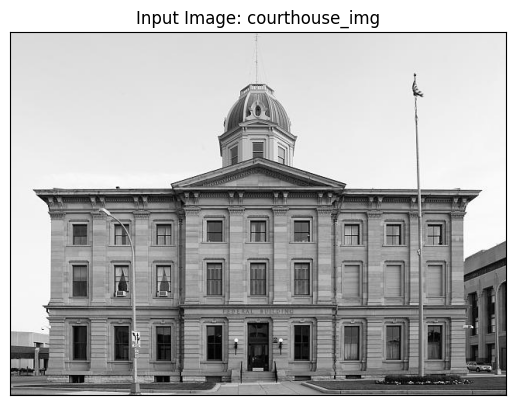

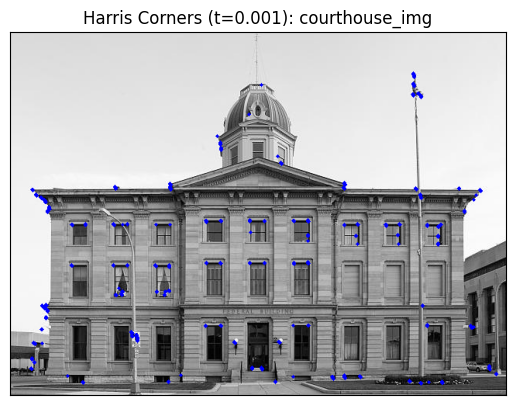

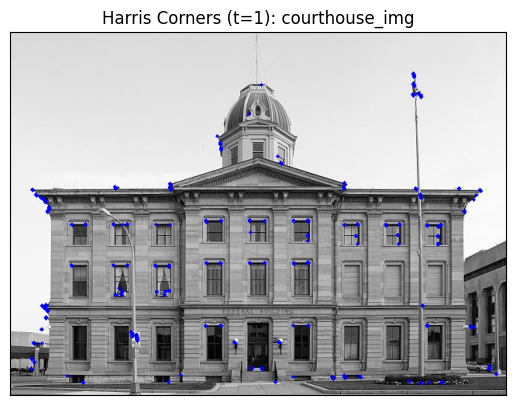

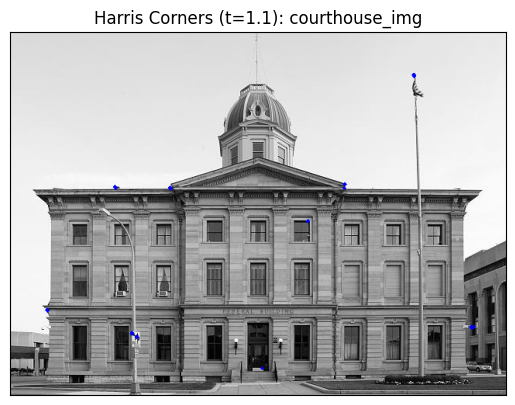

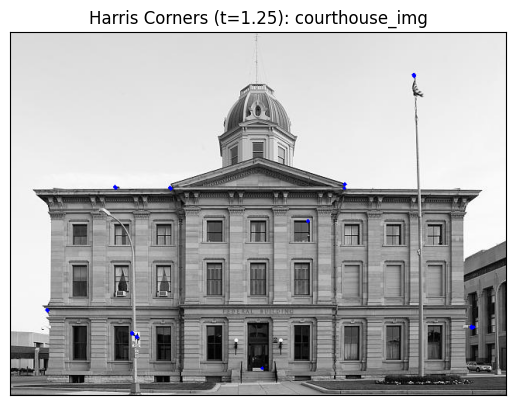

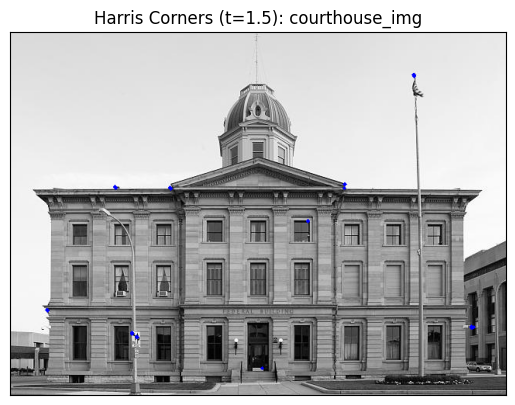

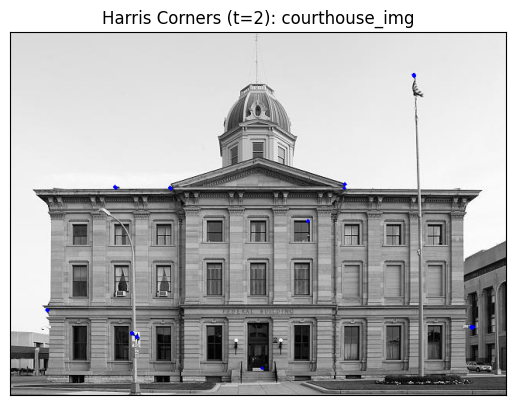

In [158]:
plt.imshow(courthouse_img)
plt.title("Input Image: courthouse_img"), plt.xticks([]), plt.yticks([])
plt.show()

t_factors = [0.001, 1, 1.1, 1.25, 1.5, 2]

for i in range(len(t_factors)):
    # Second image
    courthouse_disp_img = courthouse_img.copy()
    loc = np.where(non_max_sup[1] >= t_factors[i])

    for pt in zip(*loc[::-1]):
        cv2.circle(courthouse_disp_img, pt, 2, (0,0,255), -1)


    # display images
    plt.imshow(courthouse_disp_img)
    plt.title("Harris Corners (t="+ str(t_factors[i]) +"): courthouse_img"), plt.xticks([]), plt.yticks([])
    plt.show()



#### Discussion
As the image of the courthouse is normalized from 0 to 5, we can see that when displaying a threshold of 2, not many corners are detected. None of the corners of the windows and the door are recognized. However, when the threshold is 1, more of the corners are detected, but still there is a good amount that are left unrecognized. For example, the surveillance cameras are detected and the corners of the rooftop are really well defined.

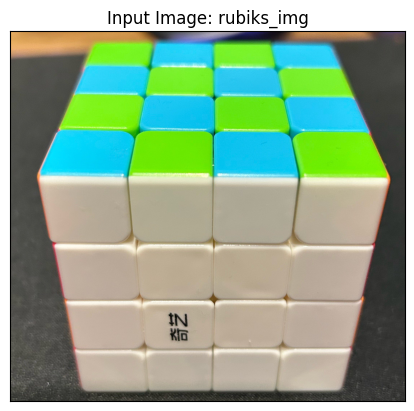

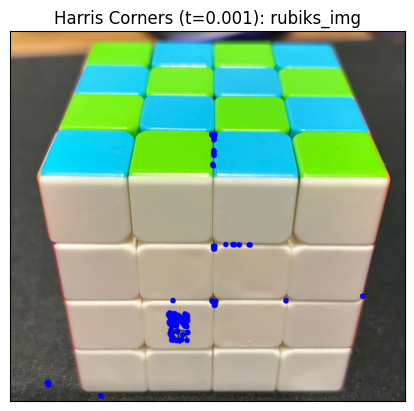

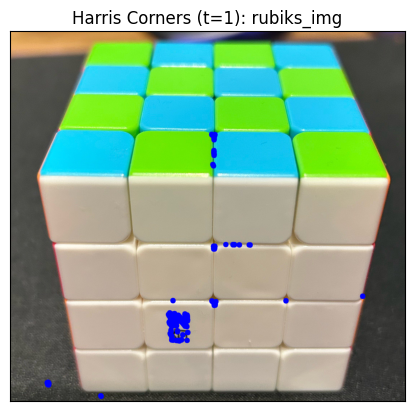

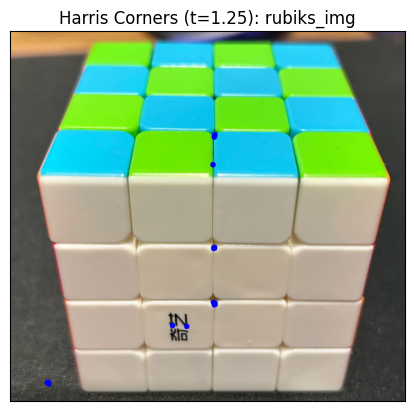

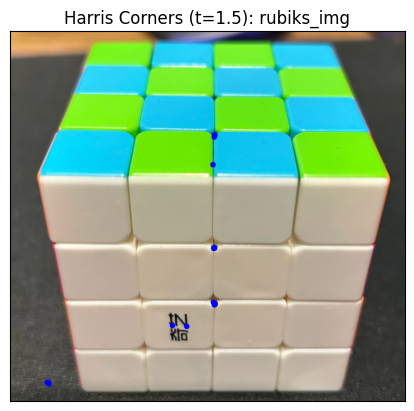

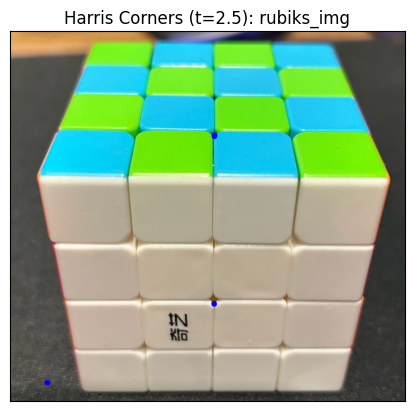

In [159]:
t_factors = [0.001, 1, 1.25, 1.5, 2.5]
plt.imshow(rubiks_img)
plt.title("Input Image: rubiks_img"), plt.xticks([]), plt.yticks([])
plt.show()
for i in range(len(t_factors)):
    rubiks_disp_img = rubiks_img.copy()
    loc = np.where(non_max_sup[2] >= t_factors[i])

    for pt in zip(*loc[::-1]):
        cv2.circle(rubiks_disp_img, pt, 15, (0,0,255), -1) 

    # display images
    plt.imshow(rubiks_disp_img)
    plt.title("Harris Corners (t="+ str(t_factors[i]) +"): rubiks_img"), plt.xticks([]), plt.yticks([])
    plt.show()
    

#### Discussion
Before doing the implemation of the Harris corner detector, I thought that this image would result in a similar display as the checkerboard image. However, as it is possible to see, it did not. At lower levels of thresholds, it mistook some edges as corners and seems like the whole logo was just made out of corners. At higher levels, it did manages to positively identify two corners, but due to the fabric that the rubiks cube was on, it also detected a random corner on the floor. Furthermore, before cropping the image, blurring the image and reducing the pixel quantity, the corner detector would identify the whole floor as corners as the fabric is a interlacing polyester fabric.


### 2 SIFT Features 

#### 2.1 SIFT in a nutshell

**Generate a Scale-Space Image Pyramid:** Create multiple versions of the input image at different scales by convolving it with Gaussian filters. This helps detect features at various sizes.

**SIFT Key Localization (Feature detection):** Identify potential keypoints by finding local extrema in the difference of Gaussian images computed from the scale-space pyramid.

**Eliminate unstable (noisy) keypoints:** Apply criteria such as contrast, edge response, and curvature ratios to discard keypoints that are likely noise or unstable structures.

**Select a canonical orientation for the SIFT keypoint:** Assign a dominant orientation to each keypoint based on local image gradients. This makes the keypoints invariant to image rotation and enhances their robustness.


#### 2.2 SIFT between two different pictures

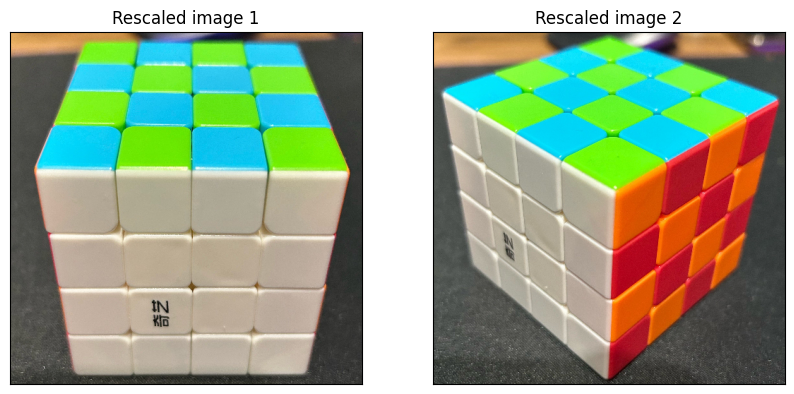

In [160]:
# Loading images
img1 = cv2.imread(path_my_folder + "image_1.jpg")
img2 = cv2.imread(path_my_folder + "image_2.jpg")

# Colors
img1 = cv2.cvtColor(img1,cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(img2,cv2.COLOR_BGR2RGB)

# Resizing image 
img1 = cv2.resize(img1, (500, 500), interpolation= cv2.INTER_LINEAR)
img2 = cv2.resize(img2, (500, 500), interpolation= cv2.INTER_LINEAR)

plt.figure(figsize=(10,10))
plt.subplot(121), plt.imshow(img1)
plt.title("Rescaled image 1"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(img2)
plt.title("Rescaled image 2"), plt.xticks([]), plt.yticks([])
plt.show()




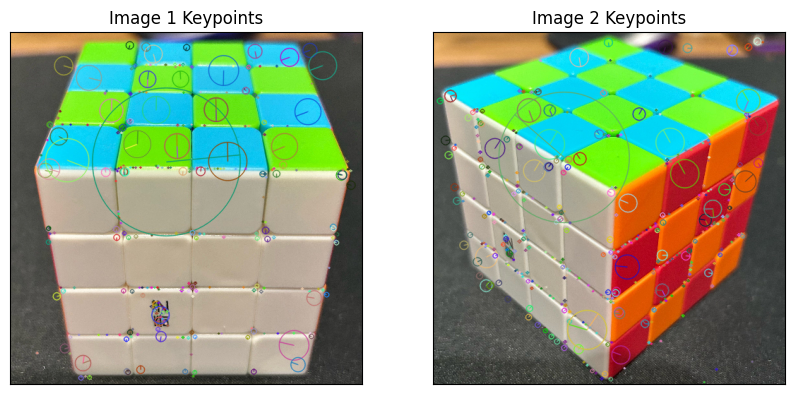

In [161]:
# Compute SIFT keypoints
sift = cv2.SIFT_create()

# https://docs.opencv.org/4.x/dc/dc3/tutorial_py_matcher.html
kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)

img1_kp = cv2.drawKeypoints(img1, kp1, None, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img2_kp = cv2.drawKeypoints(img2, kp2, None, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(10,10))
plt.subplot(121), plt.imshow(img1_kp)
plt.title("Image 1 Keypoints"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(img2_kp)
plt.title("Image 2 Keypoints"), plt.xticks([]), plt.yticks([])
plt.show()

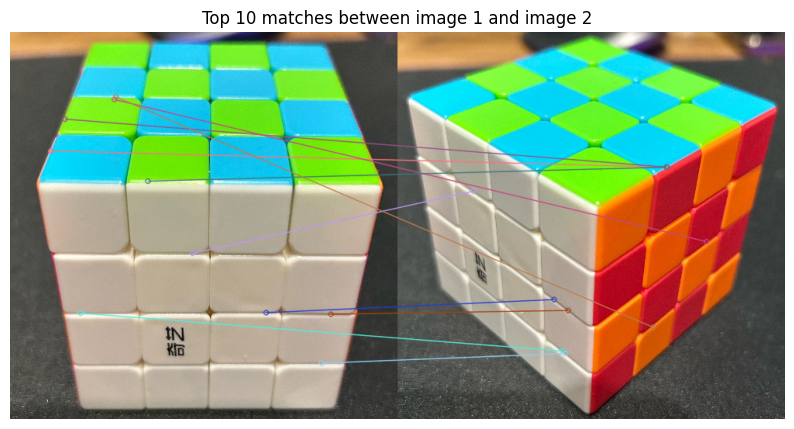

In [162]:
# Match and Sort all keypoints (brute-force)
bf = cv2.BFMatcher()
matches = bf.match(des1, des2)
matches = sorted(matches, key = lambda x:x.distance)

matched_imgs = cv2.drawMatches(img1, kp1, img2, kp2, matches[:10], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(10,10))
plt.imshow(matched_imgs)
plt.title("Top 10 matches between image 1 and image 2")
plt.axis("off")
plt.show()

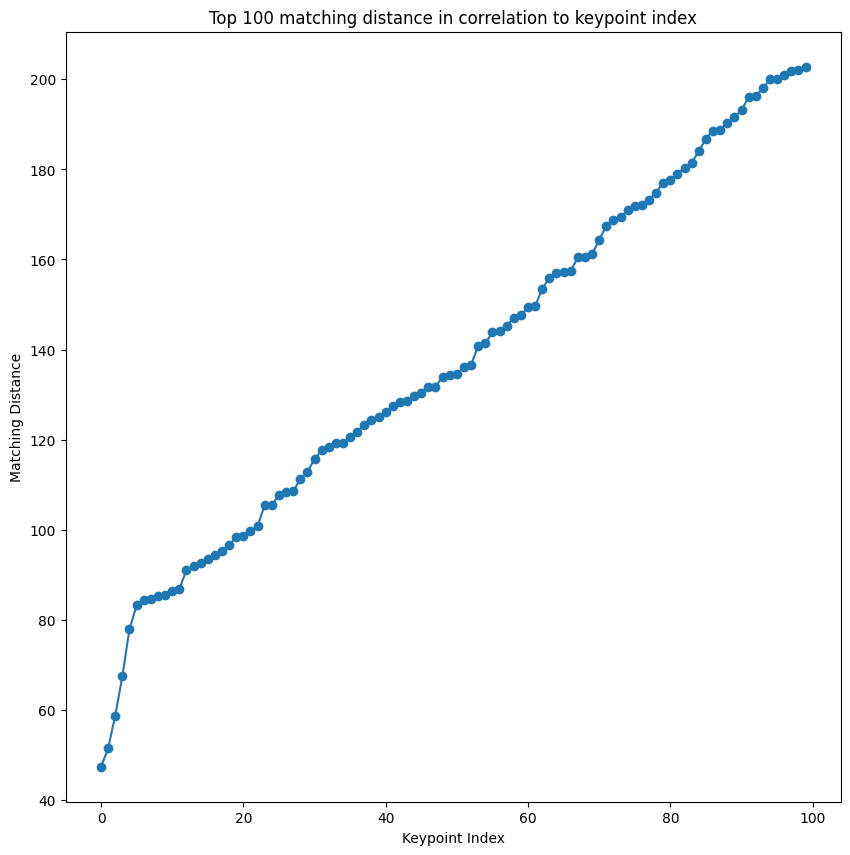

In [163]:
# Plot the matching distance 

top100_match_dist = [m.distance for m in matches[:100]]

plt.figure(figsize=(10,10))
plt.plot(list(range(100)), top100_match_dist, marker='o', linestyle='-')
plt.title("Top 100 matching distance in correlation to keypoint index")
plt.xlabel('Keypoint Index')
plt.ylabel('Matching Distance')
plt.show()

#### 2.3 Invariance Under Scale

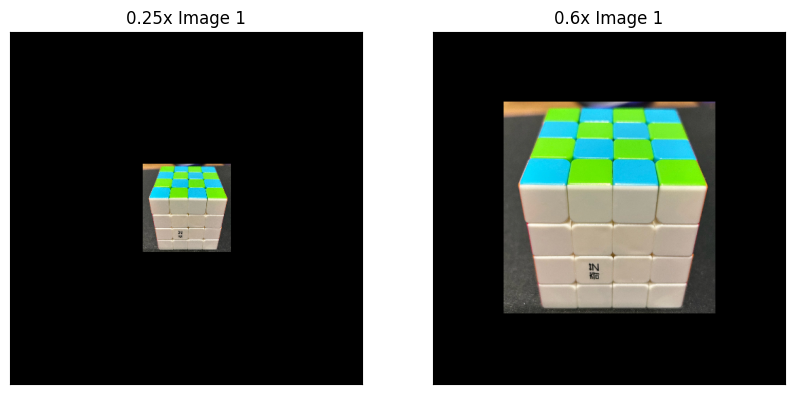

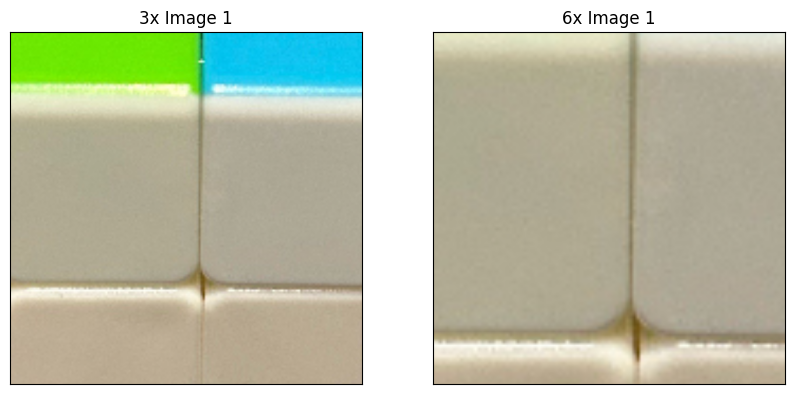

In [164]:
sift = cv2.SIFT_create()

# Compute SIFT keypoints for the image 1
kp1, des1 = sift.detectAndCompute(img1, None)

# Scaling image_1
scaled_images = []
scale_factor = [0.25, 0.6, 3, 5]
h, w, _ = img1.shape
for i in range(len(scale_factor)):
    temp_img = cv2.warpAffine(img1, cv2.getRotationMatrix2D((w/2, h/2), 0, scale_factor[i]), (w, h))
    scaled_images.append(temp_img)

# display images
plt.figure(figsize=(10,10))
plt.subplot(121), plt.imshow(scaled_images[0])
plt.title("0.25x Image 1"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(scaled_images[1])
plt.title("0.6x Image 1"), plt.xticks([]), plt.yticks([])
plt.show()

plt.figure(figsize=(10,10))
plt.subplot(121), plt.imshow(scaled_images[2])
plt.title("3x Image 1"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(scaled_images[3])
plt.title("6x Image 1"), plt.xticks([]), plt.yticks([])
plt.show()


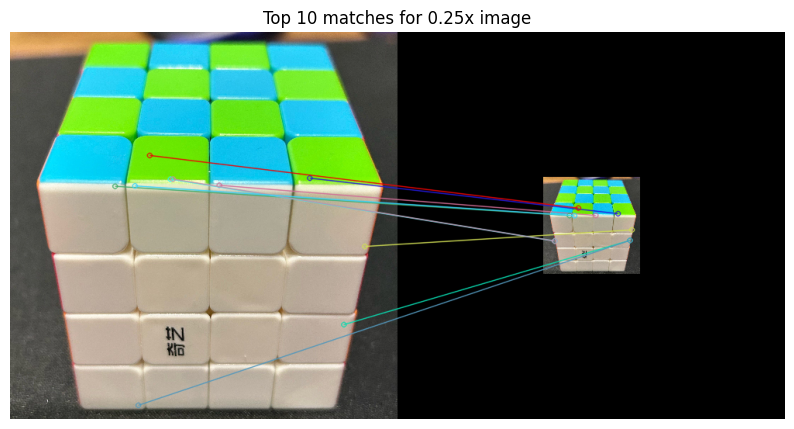

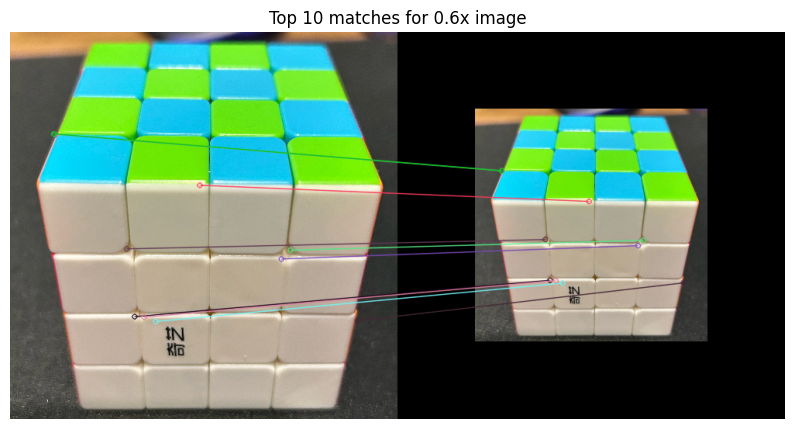

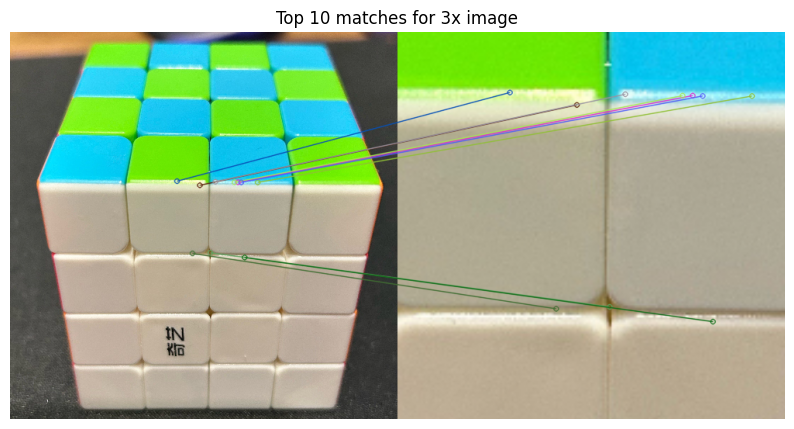

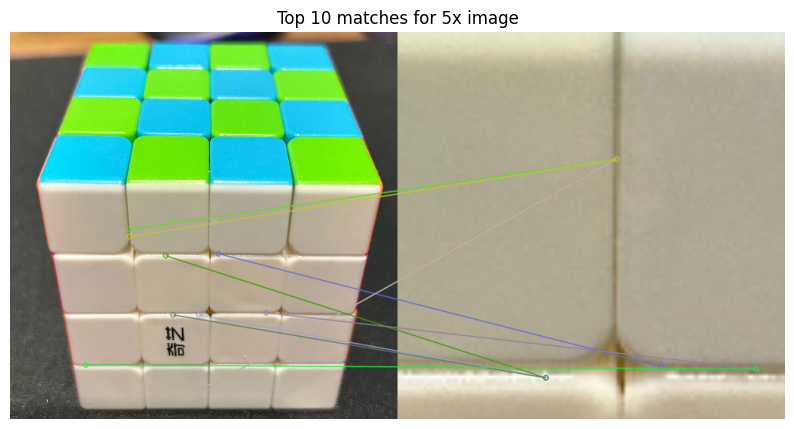

In [165]:
all_kp = []
all_des = []

for i in range(len(scaled_images)):
    temp_kp, temp_des = sift.detectAndCompute(scaled_images[i], None)
    all_kp.append(temp_kp)
    all_des.append(temp_des)
    
# Match and Sort all keypoints (brute-force)
bf = cv2.BFMatcher()
all_matches = []
for i in range(len(all_kp)):
    temp_matches = bf.match(des1, all_des[i])
    temp_matches = sorted(temp_matches, key = lambda x:x.distance)
    all_matches.append(temp_matches)

    
for i in range(len(all_matches)):
    temp_matched_img = cv2.drawMatches(img1, kp1, scaled_images[i], all_kp[i], all_matches[i][:10], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    
    plt.figure(figsize=(10,10))
    plt.imshow(temp_matched_img)
    plt.title("Top 10 matches for " + str(scale_factor[i]) + "x image")
    plt.axis("off")
    plt.show()




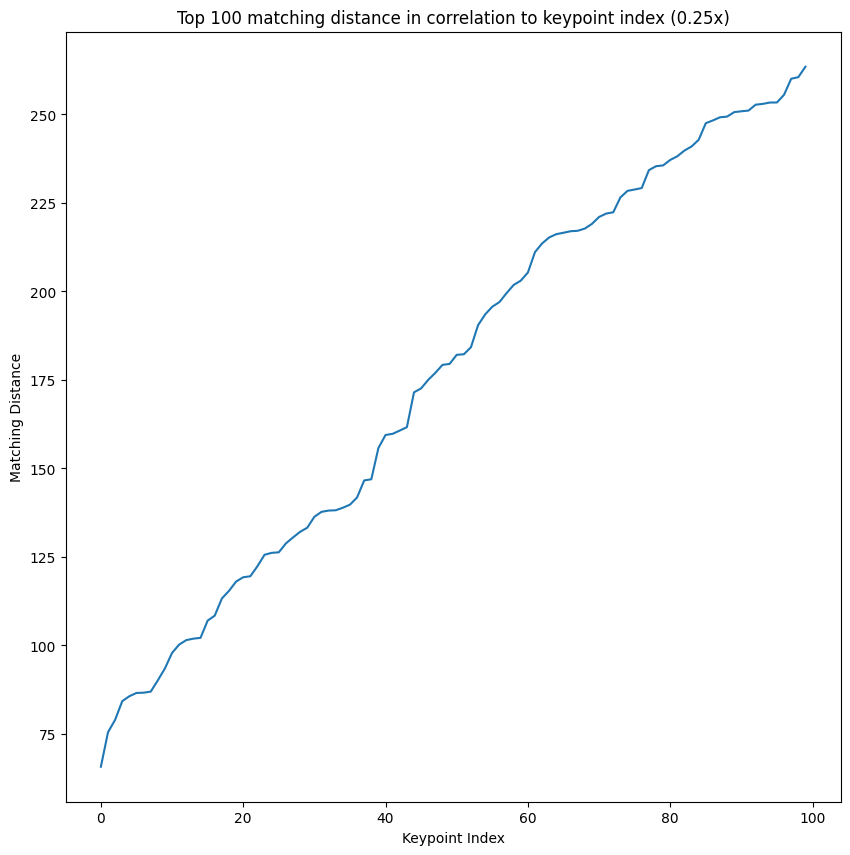

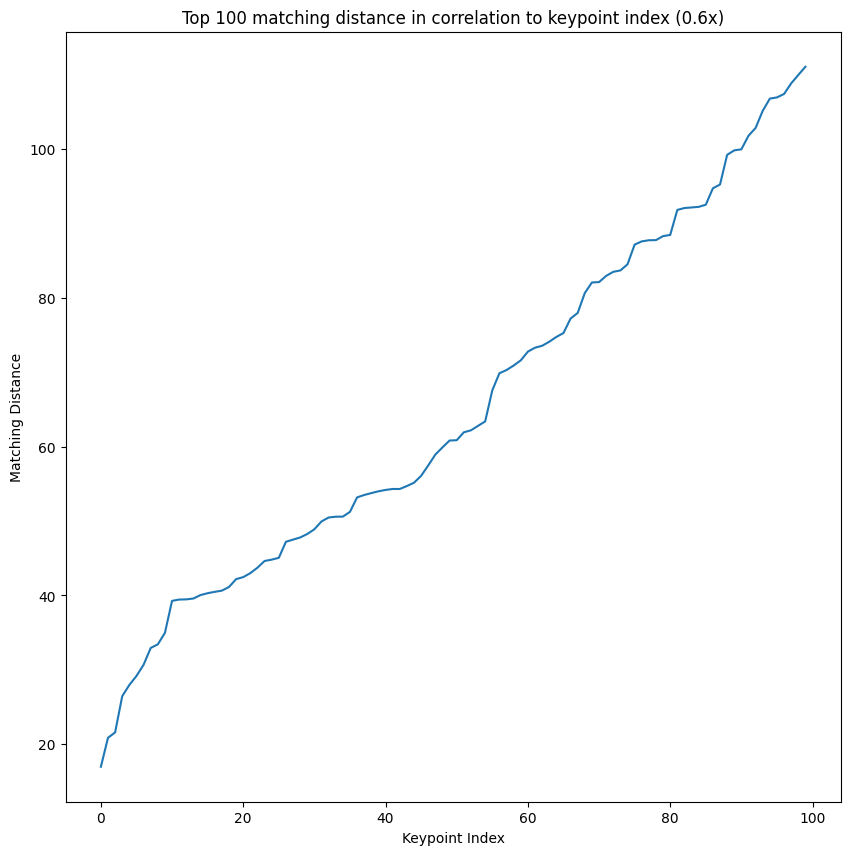

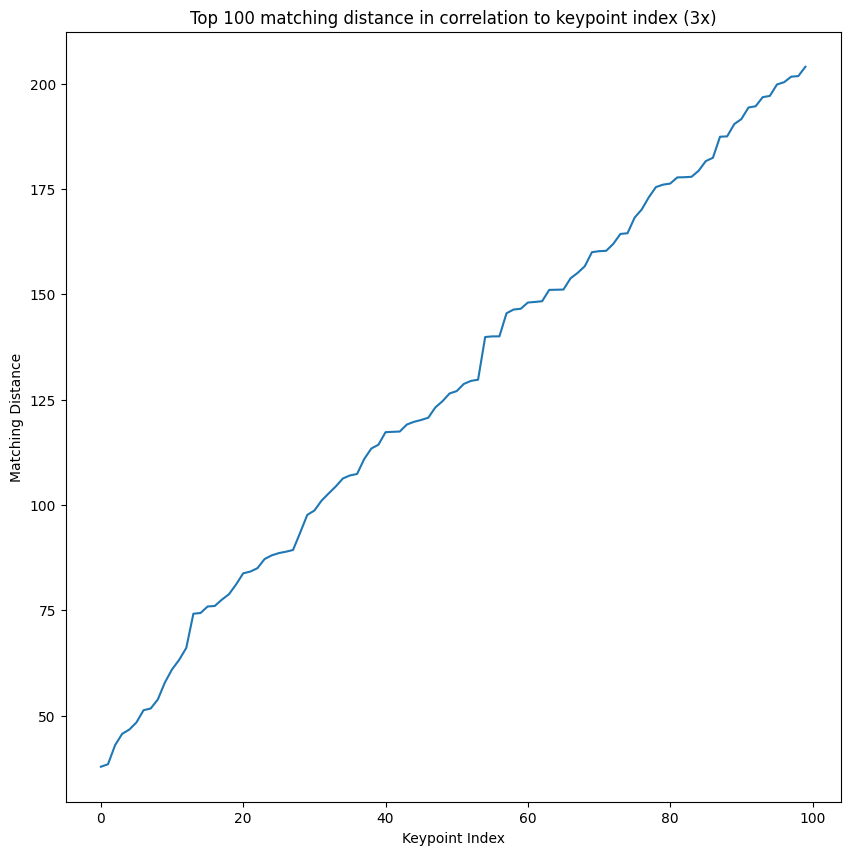

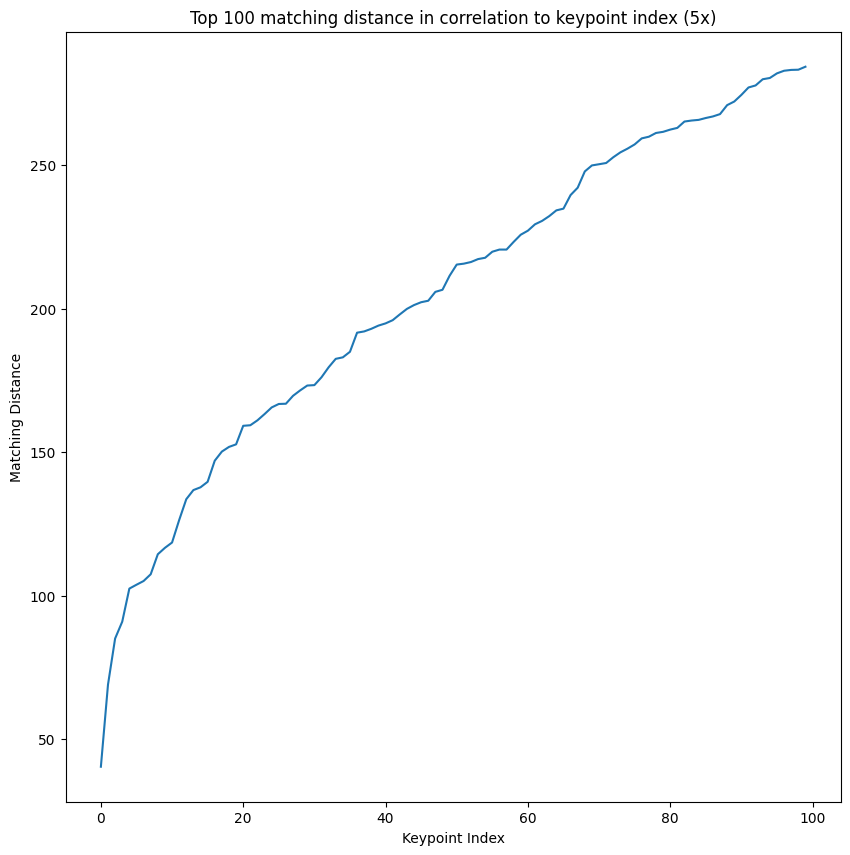

In [166]:
# Plot the matching distance 

for i in range(len(all_matches)):
    temp_top100_match_dist = [m.distance for m in all_matches[i][:100]]
    plt.figure(figsize=(10,10))
    plt.plot(list(range(100)), temp_top100_match_dist)
    plt.title("Top 100 matching distance in correlation to keypoint index (" +str(scale_factor[i]) + "x)"  )
    plt.xlabel('Keypoint Index')
    plt.ylabel('Matching Distance')
    plt.show()

##### Discussion

It is possible to see that the 0.6x and the 3x scaled image have shorter distances compared to the 0.25x and 5x scaled image. This may be due to the image used having repetitive patterns. The expected trend should be a decreasing distance as we increase the scale. In the case of the current image, at the higher scales, the program has difficulty differentiating different features and leads to higher distances.  

#### 2.4 Invariance Under Rotation

In [167]:
# https://stackoverflow.com/questions/9041681/opencv-python-rotate-image-by-x-degrees-around-specific-point
def rotate_image(image, angle):
  image_center = tuple(np.array(image.shape[1::-1]) / 2)
  rot_mat = cv2.getRotationMatrix2D(image_center, angle, 1.0)
  result = cv2.warpAffine(image, rot_mat, image.shape[1::-1], flags=cv2.INTER_LINEAR)
  return result

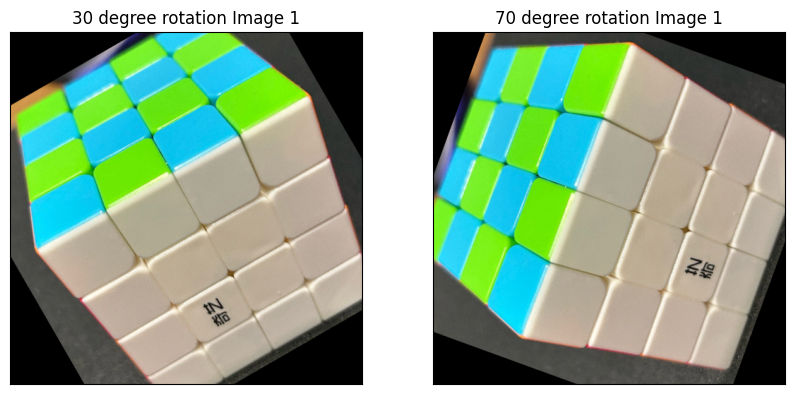

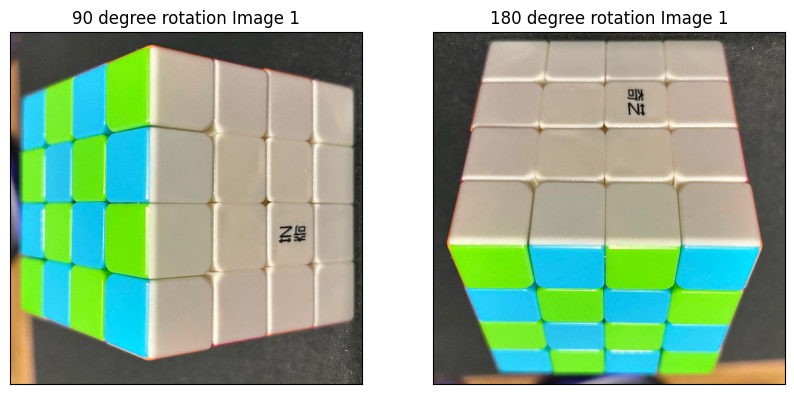

In [168]:
# Rotating image_1
rotated_images = []
rotate_factor = [30, 70, 90, 180]
for i in range(len(rotate_factor)):
    temp_img = rotate_image(img1, rotate_factor[i])
    rotated_images.append(temp_img)

# display images
plt.figure(figsize=(10,10))
plt.subplot(121), plt.imshow(rotated_images[0])
plt.title("30 degree rotation Image 1"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(rotated_images[1])
plt.title("70 degree rotation Image 1"), plt.xticks([]), plt.yticks([])
plt.show()

plt.figure(figsize=(10,10))
plt.subplot(121), plt.imshow(rotated_images[2])
plt.title("90 degree rotation Image 1"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(rotated_images[3])
plt.title("180 degree rotation Image 1"), plt.xticks([]), plt.yticks([])
plt.show()

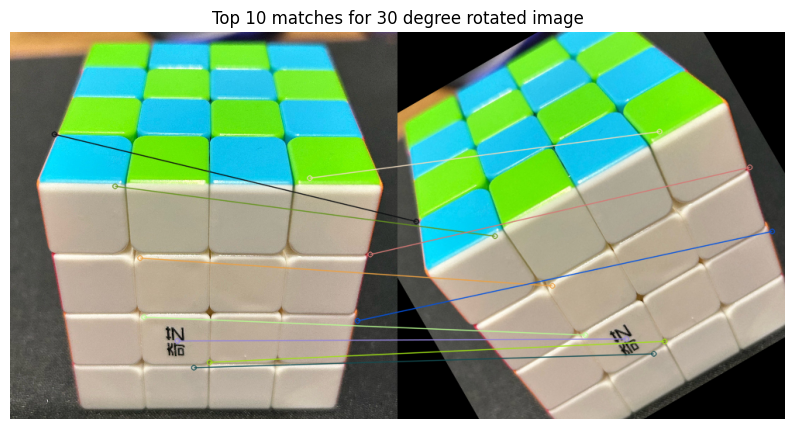

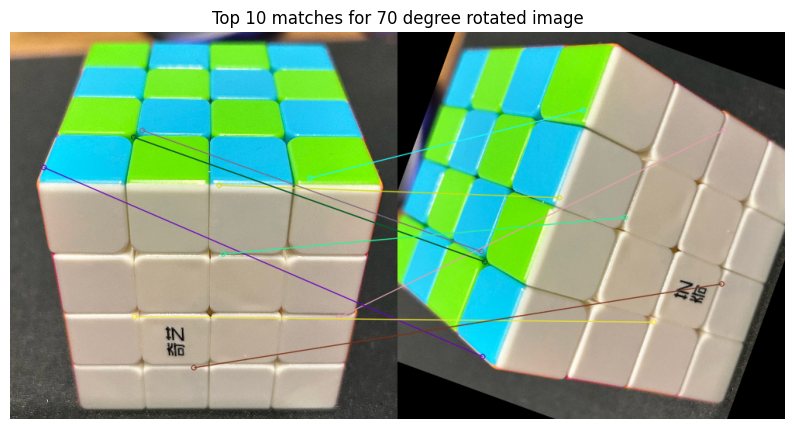

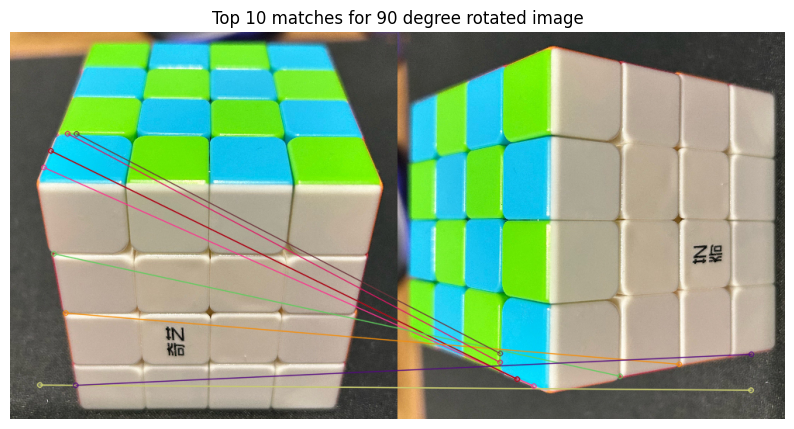

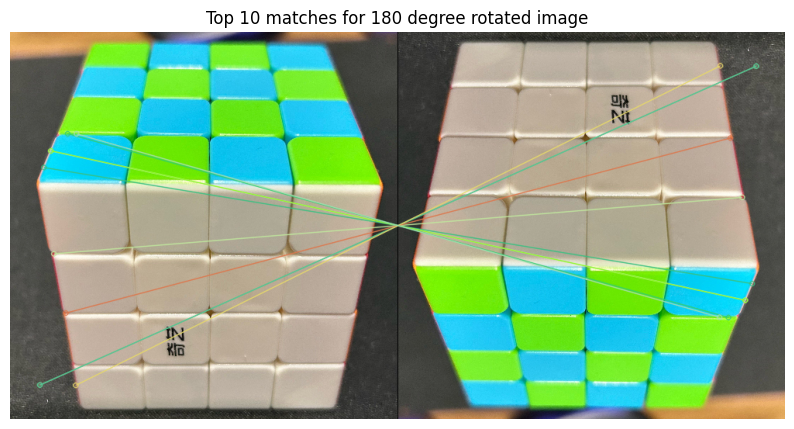

In [171]:
all_kp = []
all_des = []

for i in range(len(scaled_images)):
    temp_kp, temp_des = sift.detectAndCompute(rotated_images[i], None)
    all_kp.append(temp_kp)
    all_des.append(temp_des)
    
# Match and Sort all keypoints (brute-force)
bf = cv2.BFMatcher()
all_matches = []
for i in range(len(all_kp)):
    temp_matches = bf.match(des1, all_des[i])
    temp_matches = sorted(temp_matches, key = lambda x:x.distance)
    all_matches.append(temp_matches)

    
for i in range(len(all_matches)):
    temp_matched_img = cv2.drawMatches(img1, kp1, rotated_images[i], all_kp[i], all_matches[i][:10], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    
    plt.figure(figsize=(10,10))
    plt.imshow(temp_matched_img)
    plt.title("Top 10 matches for " + str(rotate_factor[i]) + " degree rotated image")
    plt.axis("off")
    plt.show()

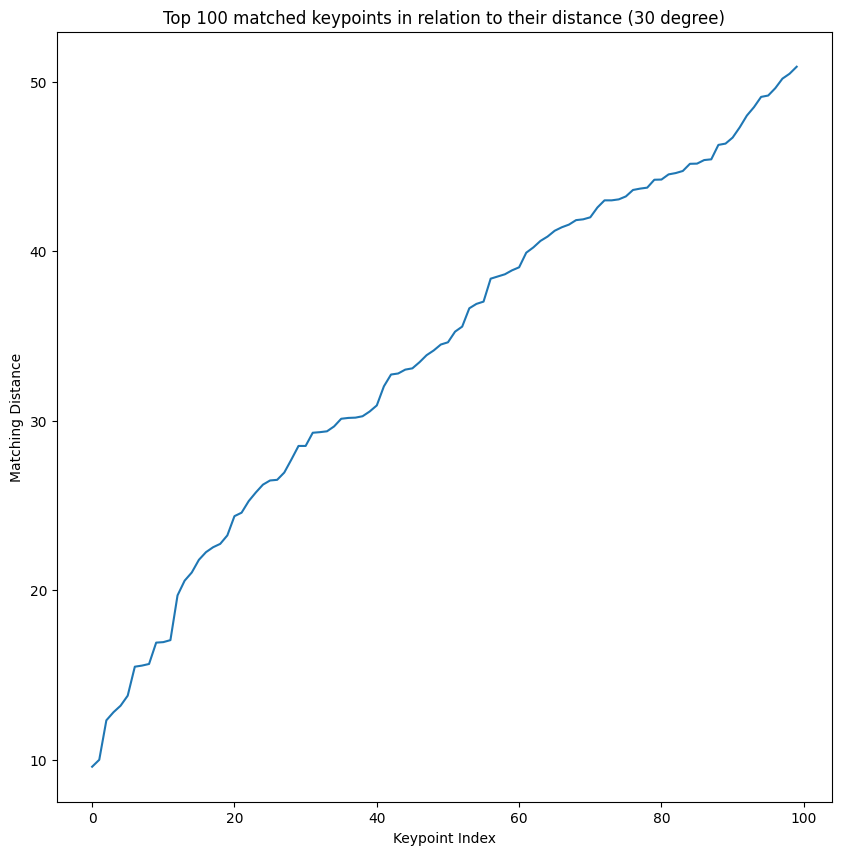

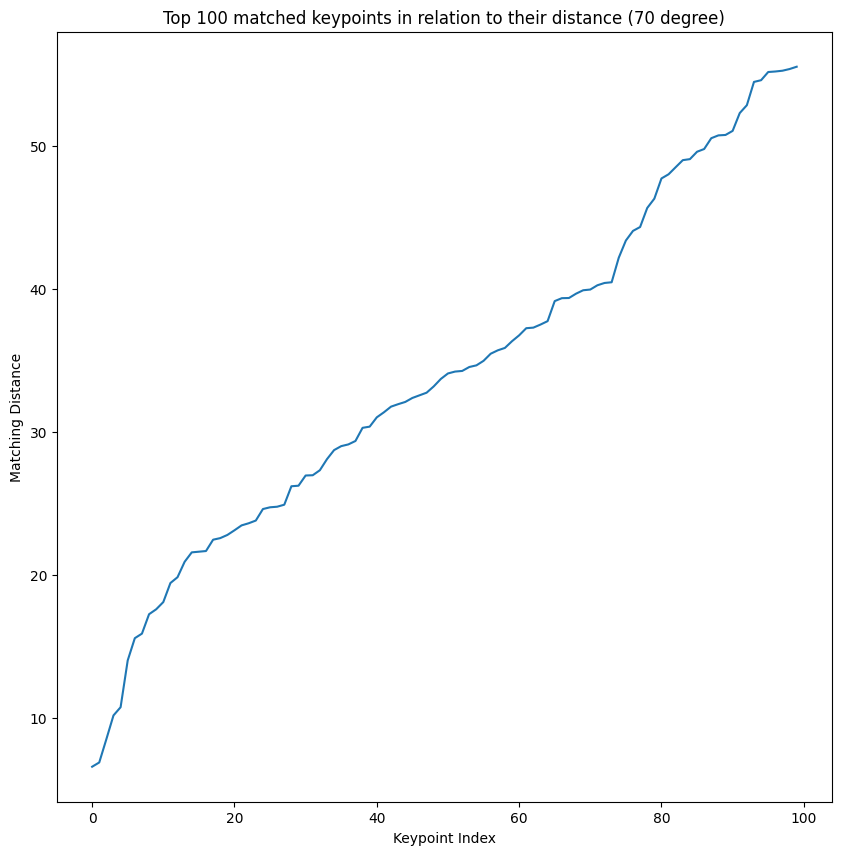

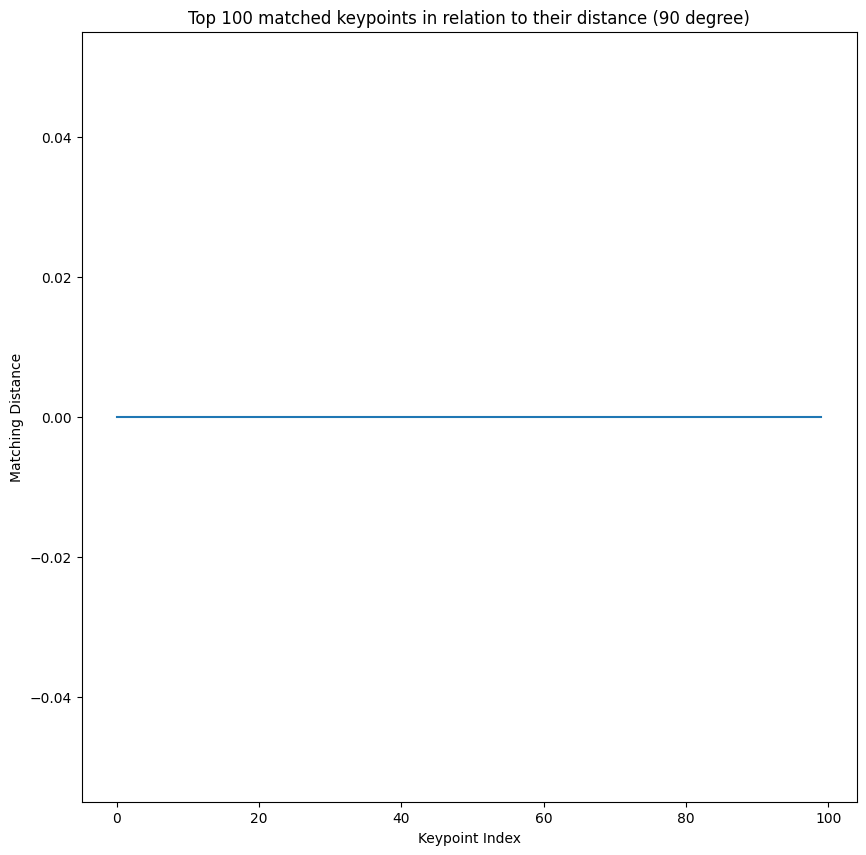

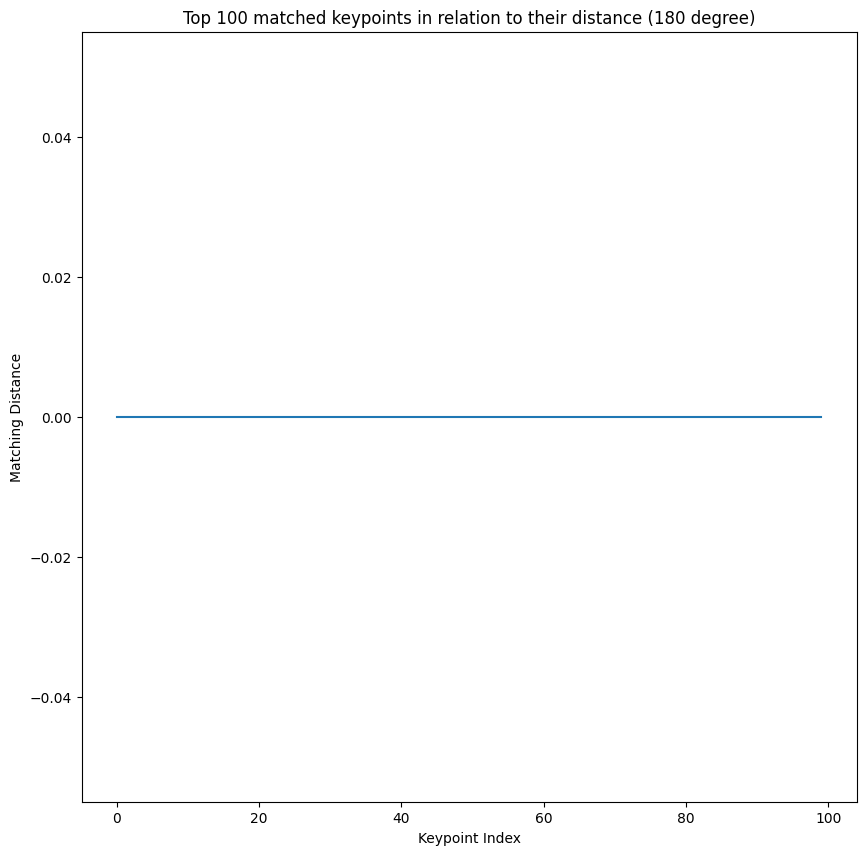

In [173]:
# Plot the matching distance 

for i in range(len(all_matches)):
    temp_top100_match_dist = [m.distance for m in all_matches[i][:100]]
    plt.figure(figsize=(10,10))
    plt.plot(list(range(100)), temp_top100_match_dist)
    plt.title("Top 100 matched keypoints in relation to their distance (" +str(rotate_factor[i]) + " degree)")
    plt.xlabel('Keypoint Index')
    plt.ylabel('Matching Distance')
    plt.show()

##### Discussion

It is possible to observe that for the images that rotated 30 and 70 degrees, the matching distances are relatively low indicating that the original image and the rotated images were similar. As the features did not change in size, the program could find the keypoints easily. However, when rotating the image by 90 degrees and 180 degrees, the matching distance are exactly 0. This is possibly due to the symmetry which allows the detection of keypoints to be seamless. 

### 3 Image Stiching 


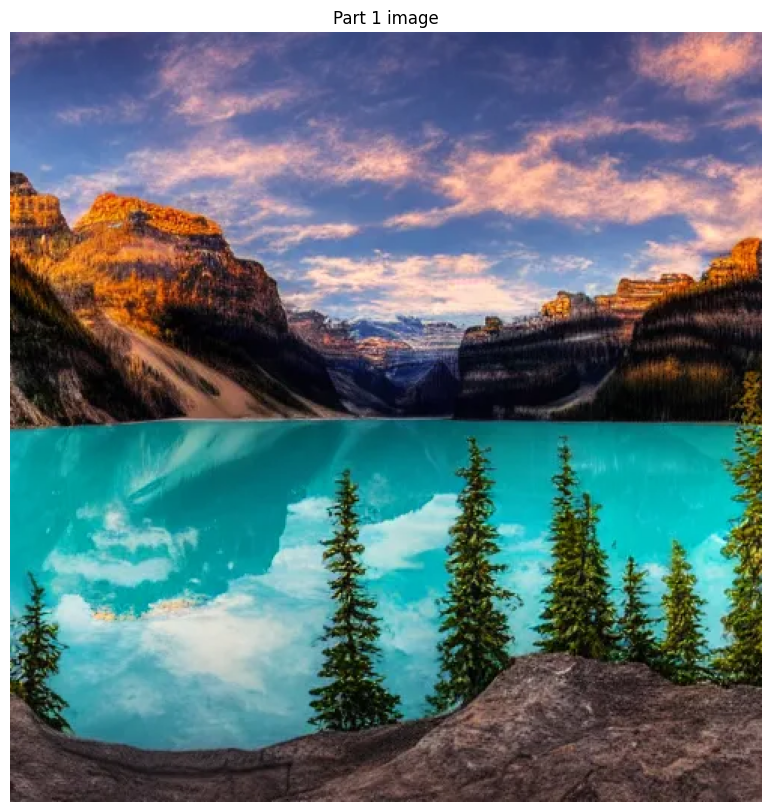

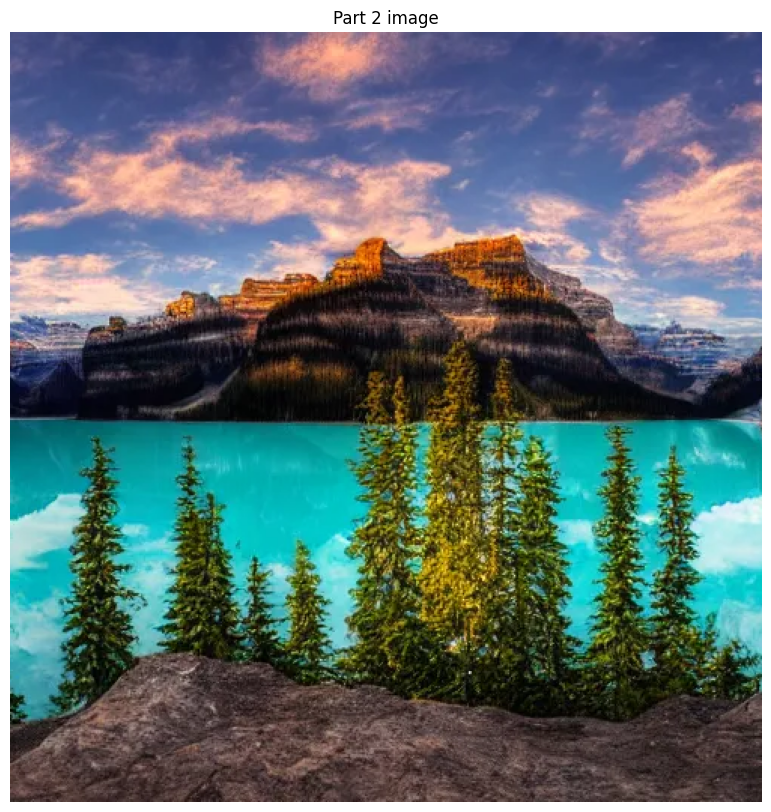

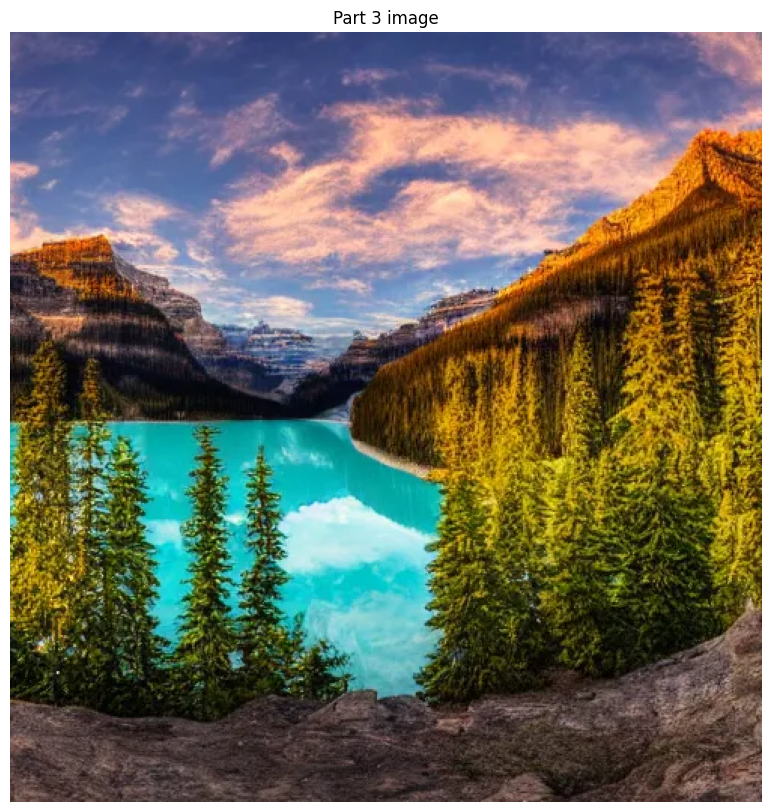

In [174]:
# Load images
part_1 = cv2.imread(path_folder_Q3 + "part1.png")
part_2 = cv2.imread(path_folder_Q3 + "part2.png")
part_3 = cv2.imread(path_folder_Q3 + "part3.png")

part_1 = cv2.cvtColor(part_1, cv2.COLOR_BGR2RGB)
part_2 = cv2.cvtColor(part_2, cv2.COLOR_BGR2RGB)
part_3 = cv2.cvtColor(part_3, cv2.COLOR_BGR2RGB)

all_img = [part_1, part_2, part_3]

for i in range(len(all_img)):    
    plt.figure(figsize=(10,10))
    plt.imshow(all_img[i])
    plt.title("Part " + str(i+1) + " image")
    plt.axis("off")
    plt.show()



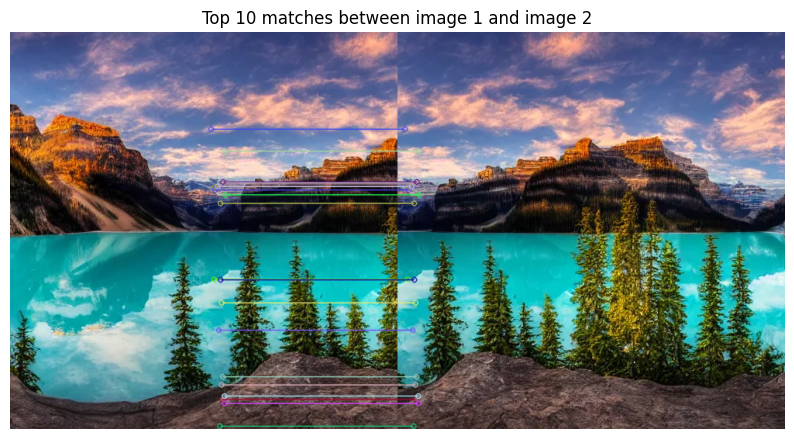

In [179]:
sift = cv2.SIFT_create()

all_kp = []
all_des = []

for i in range(len(all_img)):
    temp_kp, temp_des = sift.detectAndCompute(all_img[i], None)
    all_kp.append(temp_kp)
    all_des.append(temp_des)

    
# First 2 images
# Match and Sort all keypoints (brute-force)
bf = cv2.BFMatcher()
matches = bf.match(all_des[0], all_des[1])
matches = sorted(matches, key = lambda x:x.distance)
top_matches = matches[:20]
matched_img = cv2.drawMatches(all_img[0], all_kp[0], all_img[1], all_kp[1], top_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(10,10))
plt.imshow(matched_img)
plt.title("Top 10 matches between image 1 and image 2")
plt.axis("off")
plt.show()

    
    

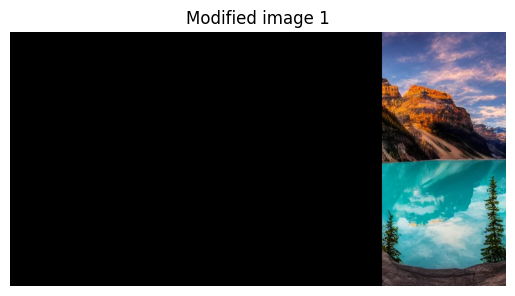

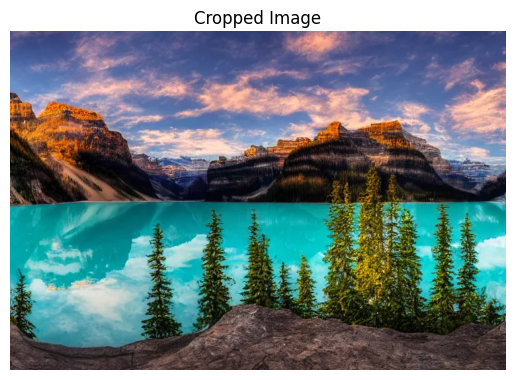

In [180]:
# Find the homography that best matches the keypoints from image 1 and 2 using the RANSAC method
best_matches = []
for _, m in enumerate(top_matches):
    best_matches.append((m.queryIdx, m.trainIdx))
    
left_pts = np.float32([all_kp[1][i].pt for (_, i) in best_matches])  # Using keypoints from image 1
right_pts = np.float32([all_kp[0][i].pt for (i, _) in best_matches])  # Using keypoints from image 2

# Shifting image 2
for i in range(len(right_pts)):
    right_pts[i][0] += all_img[0].shape[1]

# Find the homography with keypoints from image 1 and image 2
H, _ = cv2.findHomography(left_pts, right_pts, cv2.RANSAC, 5.0)

h0, w0, _ = all_img[0].shape
h1, w1, _ = all_img[1].shape

# Warp image 1 onto image 2 using the computed homography
modified_image1 = cv2.warpPerspective(all_img[0], H, (w0 + w1, h1))
plt.imshow(modified_image1)
plt.title("Modified image 1")
plt.axis("off")
plt.show()


# Removing unused space
non_black_pixels = np.any(modified_image1 != [0, 0, 0], axis=-1)
left = np.argmax(non_black_pixels, axis=1)
right = modified_image1.shape[1] - np.argmax(np.flip(non_black_pixels, axis=1), axis=1)
modified_image1 = modified_image1[:, min(left):max(right)]

image12 = np.zeros((max(h0, h1), w0 + modified_image1.shape[1], 3), dtype=np.uint8)
image12[:, :modified_image1.shape[1], :] = modified_image1
image12[:, modified_image1.shape[1]:, :] = all_img[1]


plt.imshow(image12)
plt.title("Cropped Image")
plt.axis("off")
plt.show()



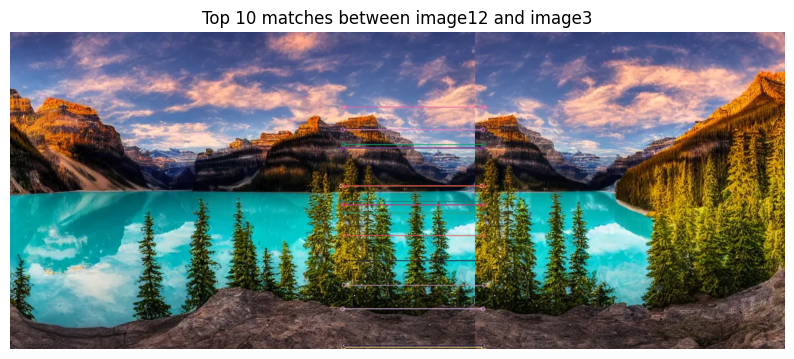

In [181]:
kp, des = sift.detectAndCompute(image12, None)
    
# Match and Sort all keypoints (brute-force)
bf = cv2.BFMatcher()
matches = bf.match(des, all_des[2])
matches = sorted(matches, key = lambda x:x.distance)
top_matches = matches[:20]
matched_img = cv2.drawMatches(image12, kp, all_img[2], all_kp[2], top_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(10,10))
plt.imshow(matched_img)
plt.title("Top 10 matches between image12 and image3")
plt.axis("off")
plt.show()


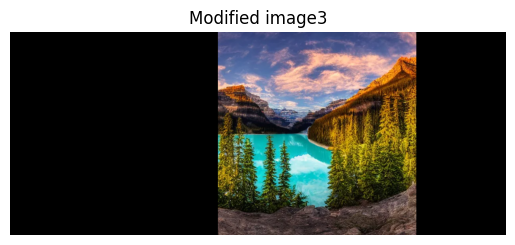

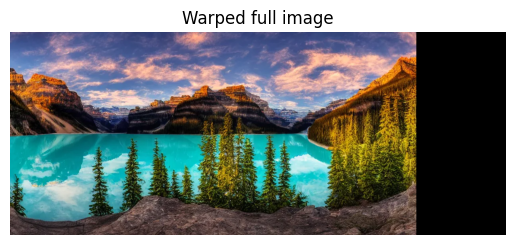

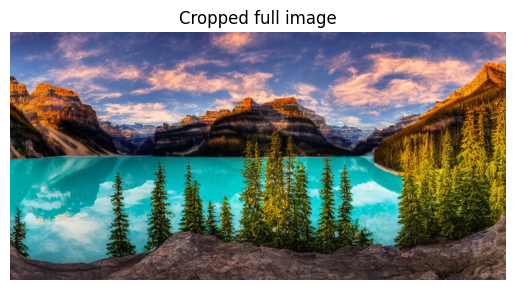

In [182]:
# Find the homography that best matches the keypoints from image 1 and 2 using the RANSAC method
best_matches = []
for _, m in enumerate(top_matches):
    best_matches.append((m.queryIdx, m.trainIdx))
    
right_pts = np.float32([all_kp[2][i].pt for (_, i) in best_matches])
left_pts = np.float32([kp[i].pt for (i, _) in best_matches])

H, _ = cv2.findHomography(right_pts, left_pts, cv2.RANSAC, 5.0)

h12, w12, _ = image12.shape
h3, w3, _ = all_img[2].shape

image123 = cv2.warpPerspective(all_img[2], H, (w12+w3,h12))

plt.imshow(image123)
plt.title("Modified image3")
plt.axis("off")
plt.show()

image123[:,:w12,:] = image12

plt.imshow(image123)
plt.title("Warped full image")
plt.axis("off")
plt.show()

# Removing unused space
non_black_pixels = np.any(image123 != [0, 0, 0], axis=-1)
left = np.argmax(non_black_pixels, axis=1)
right = image123.shape[1] - np.argmax(np.flip(non_black_pixels, axis=1), axis=1)
image123 = image123[:, min(left):max(right)]

plt.imshow(image123)
plt.title("Cropped full image")
plt.axis("off")
plt.show()

#### Discussion

Linear blending is a straightforward method for combining images efficiently. It utilizes a weighted sum approach to merge images along the same axis, making it suitable for basic stitching needs. However, for scenarios where achieving smooth transitions and reducing artifacts are paramount, pyramid blending emerges as the preferred choice. By blending Laplacian pyramids with Gaussian-blurred weights, pyramid blending produces significantly smoother images compared to linear blending. Its advanced technique ensures seamless integration of image elements, making it ideal for applications demanding enhanced visual quality and continuity.